In [1]:
%pylab notebook
%matplotlib notebook
import os, glob
import numpy as np
from matplotlib.pyplot import imshow
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import rawpy
import imageio

Populating the interactive namespace from numpy and matplotlib


In [2]:
fname = '../astrophotography_data/MilkyWayPrettyBoy/tests/3200_DSC03659.ARW'

In [3]:
raw = rawpy.imread(fname)
imarray = raw.raw_image_visible

<IPython.core.display.Javascript object>


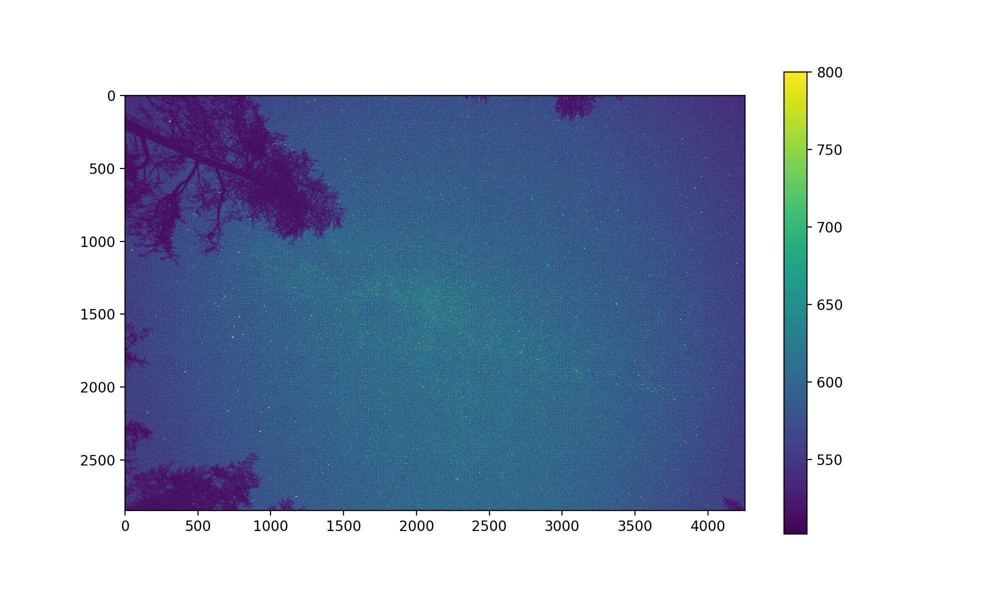

In [4]:
plt.figure(figsize=[10, 6])
plt.imshow(imarray, vmin=502, vmax=800)
plt.colorbar()

In [5]:
colors_array = raw.raw_colors_visible
mask = np.ones(shape=colors_array.shape)
red_mask = np.where(colors_array == 0, 1, 0)
green_mask_1 = np.where(colors_array == 1, 1, 0)
green_mask_2 = np.where(colors_array == 3, 1, 0)
green_mask = green_mask_1 | green_mask_2
blue_mask = np.where(colors_array == 2, 1, 0)

<IPython.core.display.Javascript object>


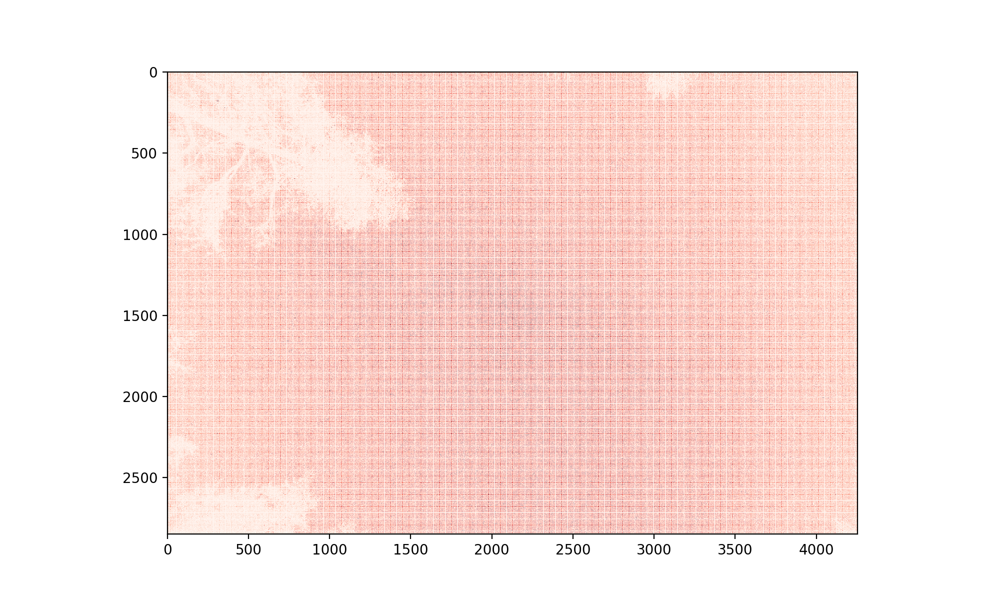

In [6]:
plt.figure(figsize=[10, 6])
plt.imshow(imarray * red_mask, cmap='Reds', vmin=500, vmax=600)

<IPython.core.display.Javascript object>


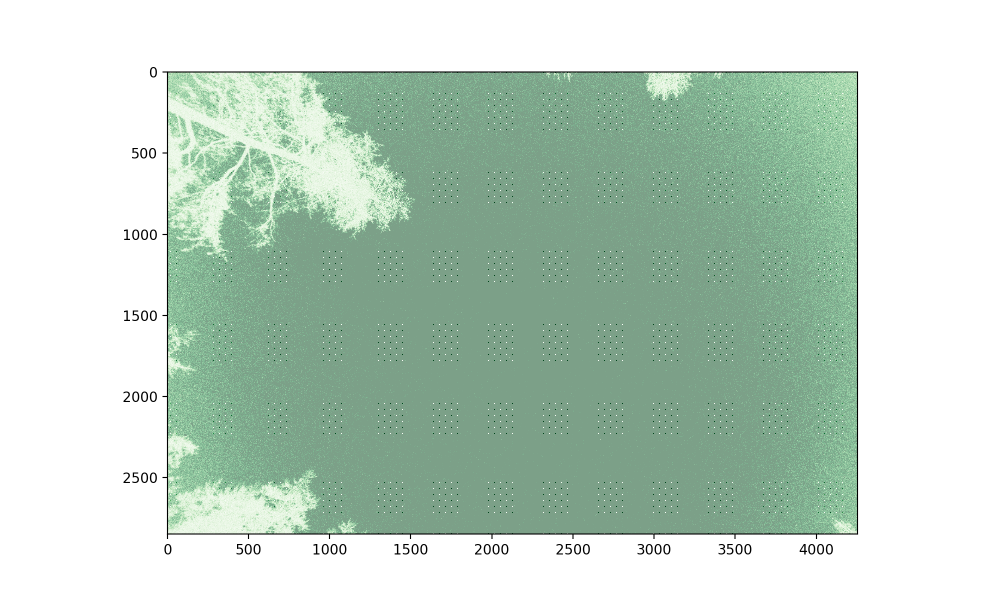

In [7]:
plt.figure(figsize=[10, 6])
plt.imshow(imarray * green_mask, cmap='Greens', vmin=500, vmax=600)

<IPython.core.display.Javascript object>


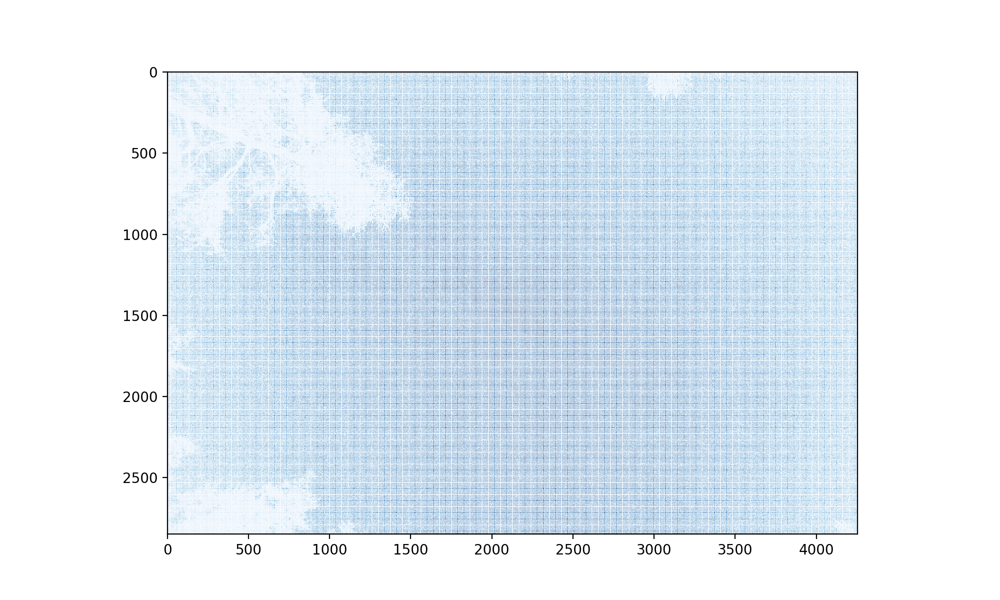

In [8]:
plt.figure(figsize=[10, 6])
plt.imshow(imarray * blue_mask, cmap='Blues', vmin=500, vmax=600)

In [9]:
aslice = np.index_exp[1170:1220,1970:2030]

<IPython.core.display.Javascript object>


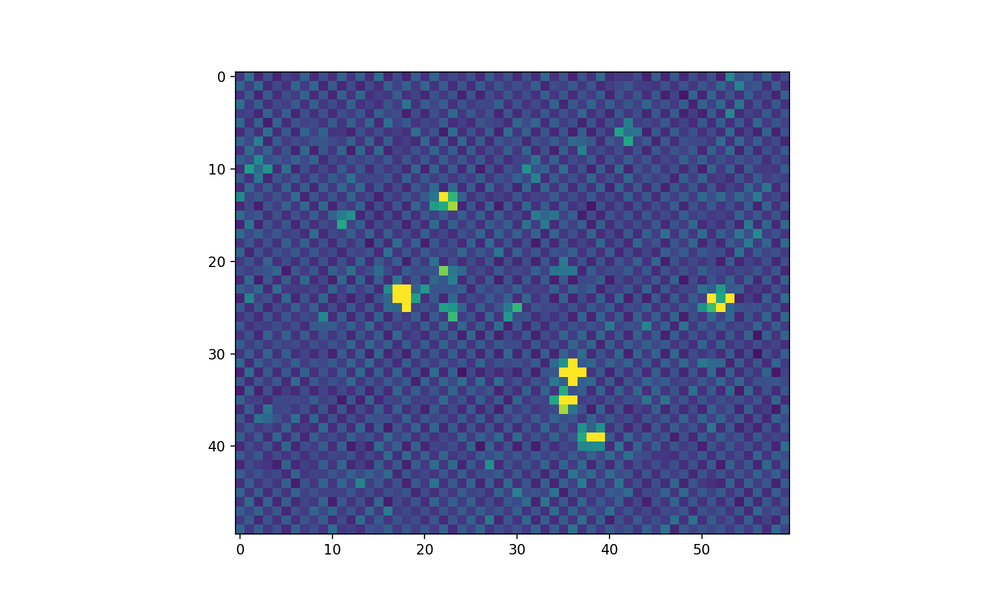

In [10]:
plt.figure(figsize=[10, 6])
plt.imshow(imarray[aslice], vmin=502, vmax=1000)

In [11]:
gray = imarray[aslice]
red = (imarray * red_mask)[aslice]
green = (imarray * green_mask)[aslice]
blue = (imarray * blue_mask)[aslice]

In [12]:
def plot_rgb_panes(gray, red, green, blue):
    figsize(9,7)
    colors = ['All','Red','Green','Blue']

    fig = plt.figure() 
    ax = None
    for color, bar, i in zip([gray, red, green, blue], ['Greys','Reds','Greens','Blues'], range(0,4)):
        if ax is None:
            ax = fig.add_subplot(2, 2, i+1)
            ax.set_title(colors[i])    
        else:
            ax1 = fig.add_subplot(2, 2, i+1, sharex=ax, sharey=ax)
            ax1.set_title(colors[i])    
        plt.imshow(color, cmap=bar)
        plt.colorbar()
    plt.show()

<IPython.core.display.Javascript object>


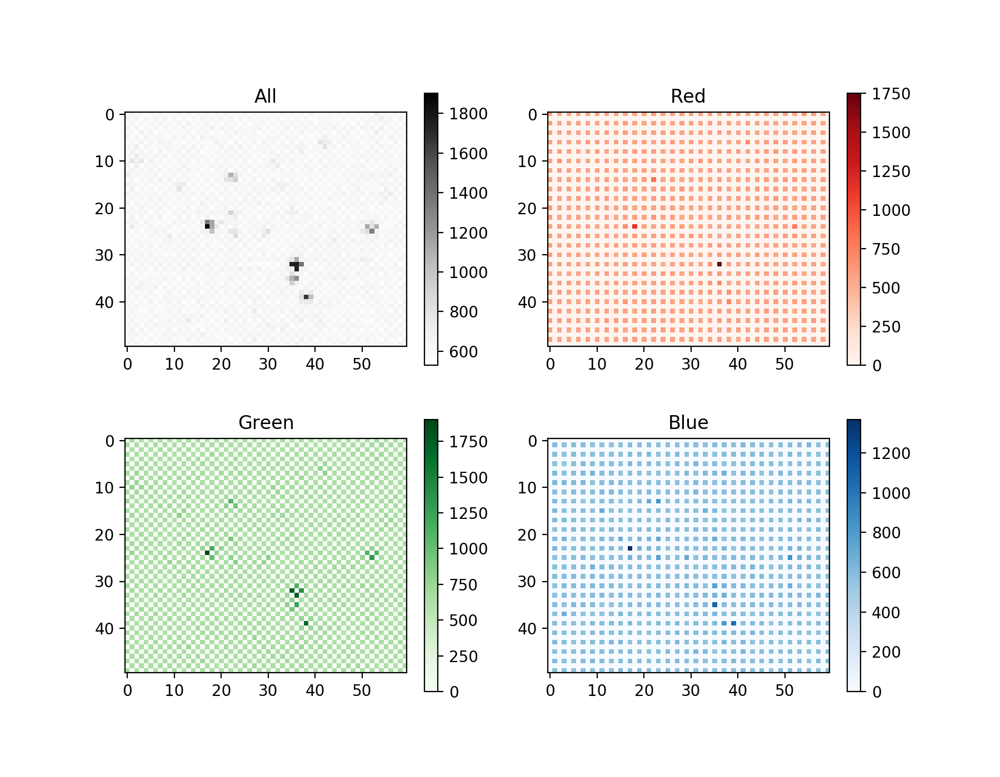

In [13]:
plot_rgb_panes(gray, red, green, blue)

In [14]:
rgb = raw.postprocess()

In [15]:
red1 = rgb[::,::,0]
green1 = rgb[::,::,1]
blue1 = rgb[::,::,2]

# empirical gray image that should be
# good for finding star image positions.

red2 = red1 * raw.camera_whitebalance[0] / raw.camera_whitebalance[1]
green2 = green1
blue2 = blue1 * raw.camera_whitebalance[2] / raw.camera_whitebalance[1]

gray2 = red2/3. + green2/3. + blue2/3.

<IPython.core.display.Javascript object>


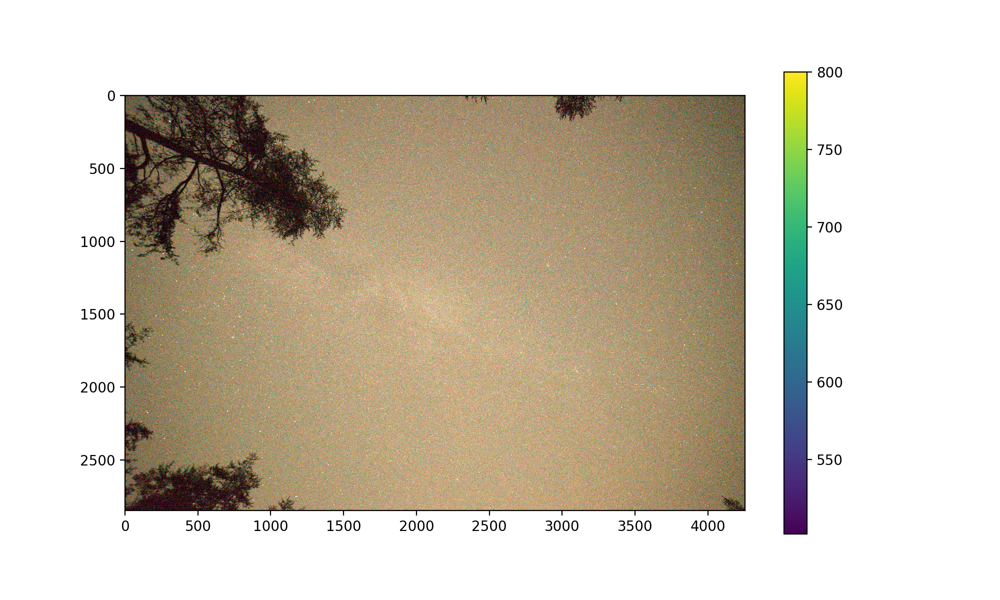

In [16]:
plt.figure(figsize=[10, 6])
plt.imshow(rgb, vmin=502, vmax=800)
plt.colorbar()

<IPython.core.display.Javascript object>


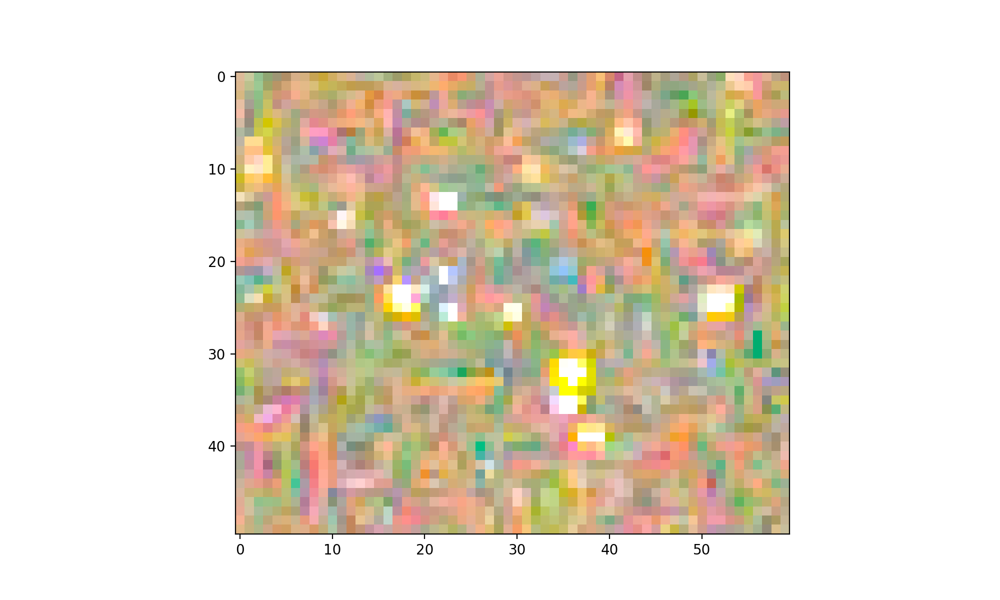

In [17]:
plt.figure(figsize=[10, 6])
plt.imshow(rgb[aslice])

<IPython.core.display.Javascript object>


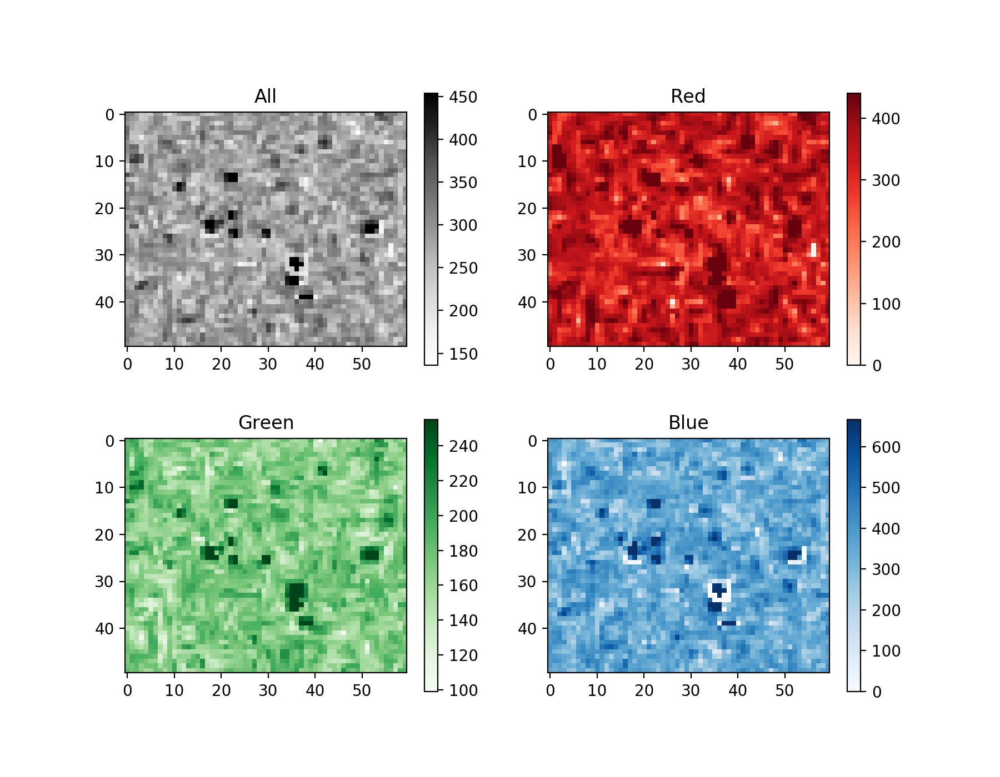

In [18]:
plot_rgb_panes(gray2[aslice], red2[aslice], green2[aslice], blue2[aslice])

<IPython.core.display.Javascript object>


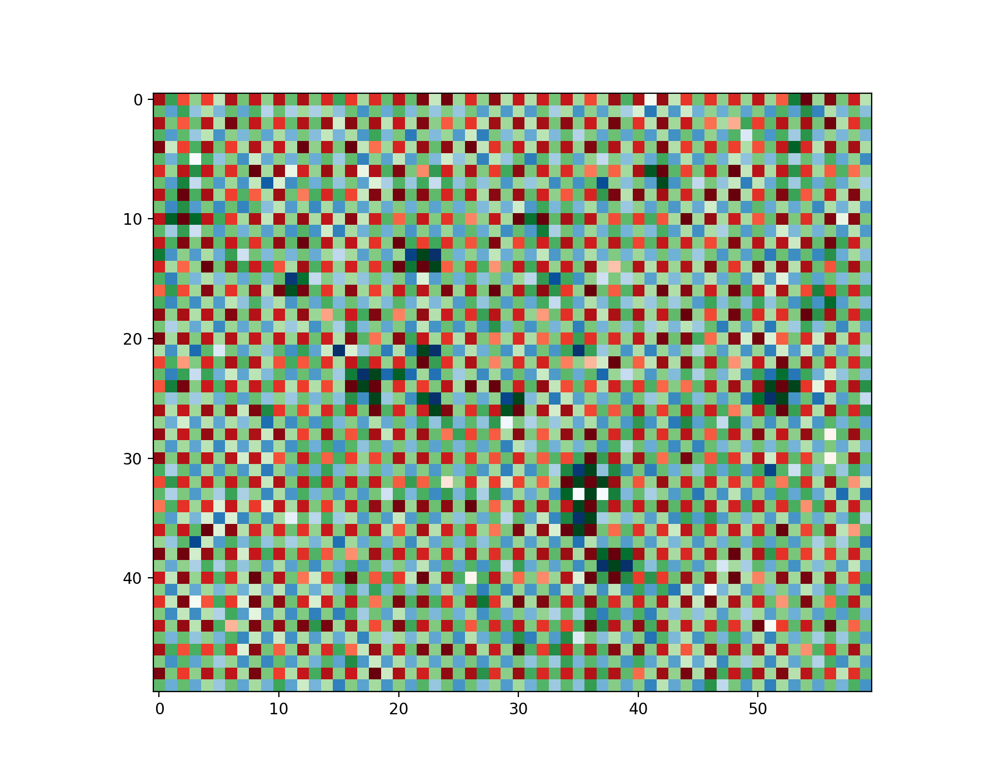

In [19]:
red_ma = np.ma.masked_where(red_mask[aslice] < 1., red_mask[aslice])
green_ma = np.ma.masked_where(green_mask[aslice] < 1., green_mask[aslice])
blue_ma = np.ma.masked_where(blue_mask[aslice] < 1., blue_mask[aslice])

fig, ax = plt.subplots()
ax.imshow(red_ma * red2[aslice], cmap=cm.Reds, interpolation='none')
ax.imshow(green_ma * green2[aslice], cmap=cm.Greens, interpolation='none')
ax.imshow(blue_ma * blue2[aslice], cmap=cm.Blues, interpolation='none')
plt.show()

<IPython.core.display.Javascript object>


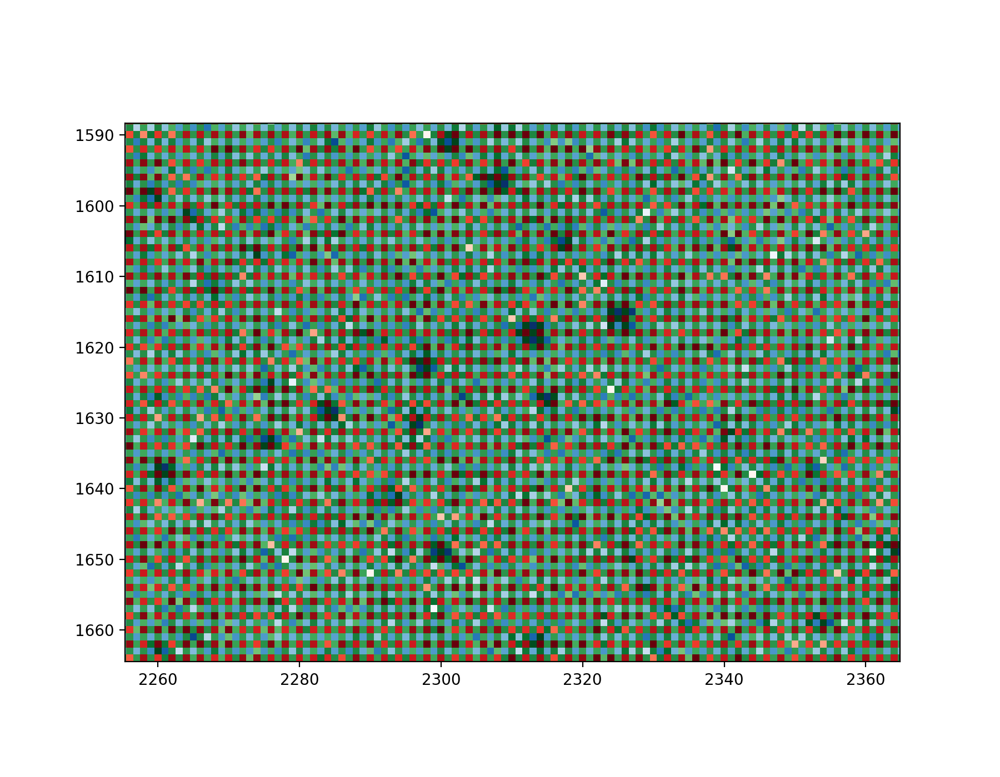

In [26]:
red_ma = np.ma.masked_where(red_mask < 1., red_mask)
green_ma = np.ma.masked_where(green_mask < 1., green_mask)
blue_ma = np.ma.masked_where(blue_mask < 1., blue_mask)

fig, ax = plt.subplots()
ax.imshow(red_ma * red2, cmap=cm.Reds, interpolation='none')
ax.imshow(green_ma * green2, cmap=cm.Greens, interpolation='none')
ax.imshow(blue_ma * blue2, cmap=cm.Blues, interpolation='none')
plt.show()